# <font color='navy'> Vector and Raster Analysis - Site Location Analysis in Nigeria </font>


### This analysis can be used for any country if data is available. Some resources listed have data for most countries. The analysis can be adapted and expanded to include more steps to answer more complex questions. 

## <font color='brown'>Question: What children population size age 0-14 health facilities cover in Nigeria in 20km catchment area? </font>

### This analysis is for training purposes only and not draw conclusions about the health system in Nigeria as more information may be needed to refine analysis like authoritative data on locaiton of health facilities, volume of patients, pediatric services by facility, catchment area size for urban/rural facility classification in the country. Maybe a catchment area size for large and small facilities can be used as well. 

### For more information about barriers accessing health care facilities in Nigeria see these resources:
### National Child Health Policy https://platform.who.int/docs/default-source/mca-documents/policy-documents/policy/nga-cc-10-03-policy-2018-eng-nat-ch-health-policy.pdf
### Breaking barriers, building bridges: the collaborative effort to reach every child in Nigeria https://www.who.int/news-room/feature-stories/detail/breaking-barriers-building-bridges-collaborative-effort-nigeria
### Association between access to a health facility and continuum of vaccination behaviors among Nigerian children https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7227619/
### Expanding Access to Health Facility Delivery in Nigeria: Progress, Challenges and Opportunities https://www.researchgate.net/publication/350144829_Expanding_Access_to_Health_Facility_Delivery_in_Nigeria_Progress_Challenges_and_Opportunities

In [1]:
%%html
<iframe width="900" height="500" src="https://www.youtube.com/embed/kVCMnJkCTyg?si=JnbdsWpejuKDWhF1" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

### Steps to prepare the data: 
1. Go to World Pop to download pediatric data by age and sex: https://hub.worldpop.org/geodata/summary?id=50256
2. Go to HDX to download locations of health facilities: https://data.humdata.org/dataset/nigeria-health-facilities
3. Go to GADM to download Nigeria's administrative boundaries: https://gadm.org/download_country.html

### Steps to analyze the data: 
1. We will sum all rasters with pediatric populations to create one raster with ages 0-14 and map the data to visualize the result. 
2. We will write population of all chilren to administrative boundaries of states in Nigeria. 
3. We will add dummy patient volume to health facility locations and create a choropleth map with population of chilren by states and proportional symbol dummy volume of patients on top of the choropleth map.  
4. We will calculate chilren populaiton size inside and outside of 20 km catchment area. 

In [4]:
####  Install these packages 
#!pip install geopandas
#!pip install rasterio
#! pip install rasterstats
#! pip install numpy
#! pip install folium
#! pip install matplotlib

In [6]:
from geopandas import gpd # to handle geospatial files

In [7]:
# Read all rasters
raster1 = r"your_path\nga_m_0_2020_constrained.tif"
raster2 = r"your_path\nga_m_1_2020_constrained.tif"
raster3 = r"your_path\nga_m_5_2020_constrained.tif"
raster4 = r"your_path\nga_m_10_2020_constrained.tif"

raster5 = r"your_path\ga_f_0_2020_constrained.tif"
raster6 = r"your_path\ga_f_0_2020_constrained.tif"
raster7 =  r"your_path\nga_f_5_2020_constrained.tif"
raster8 =  r"your_path\nga_f_10_2020_constrained.tif"

In [8]:
# Read administrative boundary of states in Nigeria
nga_states =  r"your_path\gadm41_NGA_shp\gadm41_NGA_1.shp"

In [9]:
# Read health facility data from OSM in Nigeria
health_facility =  r"your_path\hotosm_nga_health_facilities_points_shp\hotosm_nga_health_facilities_points_shp.shp"

### Step 1. Here we will sum all rasters with chilren populations to create one raster file. We will use package Rasterio and Numpy. Rasterio handles raster data, with Numpy we will create arrays and sum data along Band 1 and write the result to one final raster. In the rasters the population data is stored in Band 1 column. Make sure to ignore no values. Then using Matplotlib we will plot the result. 

In [11]:
import rasterio
from rasterio.transform import from_origin
import numpy as np

# List of raster file paths
raster_paths = [raster1, raster2, raster3, raster4, raster5, raster6, raster7, raster8]

# Open the first raster to get nodata value and read Band 1 data
try:
    first_raster = rasterio.open(raster_paths[0])
except Exception as e:
    print(f"Error opening the first raster: {e}")
    raise

nodata_value = first_raster.nodatavals[0]
band1_arrays = [raster.read(1) for raster in map(rasterio.open, raster_paths)]

# Stack the arrays along a new axis to prepare for summation
stacked_arrays = np.stack(band1_arrays, axis=0)

# Mask the nodata values in the stacked arrays
stacked_arrays = np.ma.masked_values(stacked_arrays, nodata_value)

# Sum along the new axis (axis=0) to get the final result
sum_array = np.sum(stacked_arrays, axis=0)

# Get metadata from the first raster
profile = first_raster.profile
profile.update(count=1, nodata=nodata_value)  # Update the number of bands and nodata value

# Create a new raster to store the sum
raster_sum =  r"your_path\raster_sum1.tif'
try:
    with rasterio.open(raster_sum, 'w', **profile) as dst:
        dst.write(sum_array, 1)
except Exception as e:
    print(f"Error writing the output raster: {e}")
    raise

# Close the first raster
finally:
    first_raster.close()

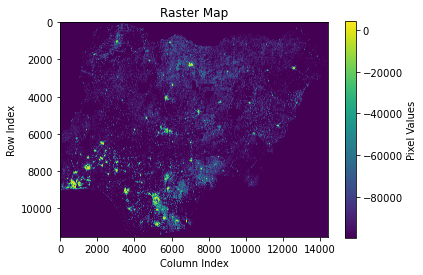

In [12]:
import matplotlib.pyplot as plt # to plot geospatial data as maps

# Open the raster file
raster_path = raster_sum
try:
    raster = rasterio.open(raster_path)
except Exception as e:
    print(f"Error opening the raster: {e}")
    raise

# Read the raster data
raster_data = raster.read(1)

# Visualize the raster data
plt.imshow(raster_data, cmap='viridis')  # Choose an appropriate colormap
plt.colorbar(label='Pixel Values')
plt.title('Raster Map')
plt.xlabel('Column Index')
plt.ylabel('Row Index')

plt.show()

# Close the raster file
raster.close()

### Step 2. We will write population of all chilren to Nigeria states using Zonal Statistics from Rasterstats package. We will create geodataframe with population of children by states. This geodataframe will be used later in the next step.  

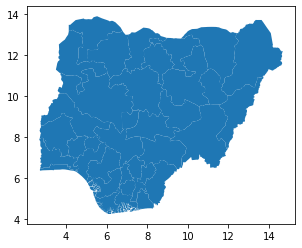

In [13]:
# Read the shapefile using geopandas
nga_states_gdf = gpd.read_file(nga_states)

# Plot the polygons using matplotlib
nga_states_gdf.plot()

# Show the plot
plt.show()

In [14]:
from rasterstats import zonal_stats

# Define shapefile path
shapefile_path = nga_states

# Define raster path
raster_path = raster_sum

# Read the shapefile and raster using geopandas and rasterio
nga_states_gdf = gpd.read_file(shapefile_path)
src = rasterio.open(raster_path)

# Perform zonal statistics 
stats = zonal_stats(nga_states_gdf, raster_path, stats="sum")

# Add the zonal statistics to the GeoDataFrame
nga_states_gdf['sum_value'] = [stat['sum'] if stat['sum'] is not None else nodata_value for stat in stats]

In [15]:
nga_states_gdf.head()

,GID_1,GID_0,COUNTRY,NAME_1,VARNAME_1,NL_NAME_1,TYPE_1,ENGTYPE_1,CC_1,HASC_1,ISO_1,geometry,sum_value
0,NGA.1_1,NGA,Nigeria,Abia,NA,NA,State,State,NA,NG.AB,NG-AB,"POLYGON ((7.46283 4.98177, 7.46261 4.96793, 7....",1477304.125
1,NGA.2_1,NGA,Nigeria,Adamawa,NA,NA,State,State,NA,NG.AD,NG-AD,"POLYGON ((12.25072 8.17262, 12.24873 8.17020, ...",2082227.125
2,NGA.3_1,NGA,Nigeria,Akwa Ibom,NA,NA,State,State,NA,NG.AK,NG-AK,"MULTIPOLYGON (((8.31958 4.55764, 8.31958 4.557...",2270688.250
3,NGA.4_1,NGA,Nigeria,Anambra,NA,NA,State,State,NA,NG.AN,NG-AN,"POLYGON ((6.93577 5.85795, 6.93626 5.84572, 6....",2154800.750
4,NGA.5_1,NGA,Nigeria,Bauchi,NA,NA,State,State,NA,NG.BA,NG-BA,"POLYGON ((9.75266 9.60087, 9.73536 9.56730, 9....",3493682.000


### Step 3. We will add dummy patient volume to health facility locations, add Latitude and Longitude coordinates, save states geodataframe as GeoJson, and create a choropleth map with population of chilren by states and proportional symbol dummy volume of patients on top of the choropleth map using Folium package. Folium uses GeoJson files and plots points by Latitude and Longitude. 

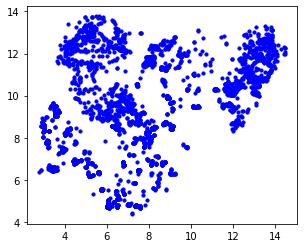

In [16]:
# Read facilities as GeoData Frame
facilities_gdf = gpd.read_file(health_facility)

# Plot the GeoDataFrame
ax = facilities_gdf.plot(marker='o', color='blue', markersize=10)

# Show the plot
plt.show()

In [17]:
# Display information about the GeoDataFrame
facilities_gdf.head()

,name,name_en,amenity,building,healthcare,healthca_1,operator_t,capacity_p,addr_full,addr_city,source,osm_id,osm_type,geometry
0,None,None,pharmacy,None,None,None,None,None,None,None,nigeriase4all.gov.ng,9874674696,nodes,POINT (6.82260 5.32315)
1,Healthway,None,pharmacy,None,None,None,None,None,None,None,None,5604092021,nodes,POINT (7.93243 5.03171)
2,NLNG RA HOSPITAL,None,hospital,None,hospital,None,None,None,None,None,None,9436743208,nodes,POINT (7.17891 4.38583)
3,PHC Ndon Utim,None,None,None,hospital,None,None,None,None,None,None,6478929277,nodes,POINT (7.82445 4.82153)
4,None,None,pharmacy,None,None,None,None,None,None,None,nigeriase4all.gov.ng,9912659247,nodes,POINT (7.38882 4.80285)


In [18]:
# Add a new column 'dummy_patient_vol' with random values up to 10000
facilities_gdf['dummy_patient_vol'] = np.random.randint(1, 10000, len(facilities_gdf))
facilities_gdf.head()

,name,name_en,amenity,building,healthcare,healthca_1,operator_t,capacity_p,addr_full,addr_city,source,osm_id,osm_type,geometry,dummy_patient_vol
0,None,None,pharmacy,None,None,None,None,None,None,None,nigeriase4all.gov.ng,9874674696,nodes,POINT (6.82260 5.32315),4678
1,Healthway,None,pharmacy,None,None,None,None,None,None,None,None,5604092021,nodes,POINT (7.93243 5.03171),3998
2,NLNG RA HOSPITAL,None,hospital,None,hospital,None,None,None,None,None,None,9436743208,nodes,POINT (7.17891 4.38583),8126
3,PHC Ndon Utim,None,None,None,hospital,None,None,None,None,None,None,6478929277,nodes,POINT (7.82445 4.82153),8821
4,None,None,pharmacy,None,None,None,None,None,None,None,nigeriase4all.gov.ng,9912659247,nodes,POINT (7.38882 4.80285),8117


In [19]:
# Open facilities_gdf as a new Geodataframe with geometry column 
facilities_xy_gdf = gpd.GeoDataFrame(facilities_gdf, geometry='geometry')

# Add latitude and longitude columns to the GeoDataFrame
facilities_xy_gdf['latitude'] = facilities_xy_gdf.geometry.y
facilities_xy_gdf['longitude'] = facilities_xy_gdf.geometry.x

# Print the updated GeoDataFrame
facilities_xy_gdf.head()

,name,name_en,amenity,building,healthcare,healthca_1,operator_t,capacity_p,addr_full,addr_city,source,osm_id,osm_type,geometry,dummy_patient_vol,latitude,longitude
0,None,None,pharmacy,None,None,None,None,None,None,None,nigeriase4all.gov.ng,9874674696,nodes,POINT (6.82260 5.32315),4678,5.323152,6.822596
1,Healthway,None,pharmacy,None,None,None,None,None,None,None,None,5604092021,nodes,POINT (7.93243 5.03171),3998,5.031708,7.932430
2,NLNG RA HOSPITAL,None,hospital,None,hospital,None,None,None,None,None,None,9436743208,nodes,POINT (7.17891 4.38583),8126,4.385831,7.178906
3,PHC Ndon Utim,None,None,None,hospital,None,None,None,None,None,None,6478929277,nodes,POINT (7.82445 4.82153),8821,4.821528,7.824450
4,None,None,pharmacy,None,None,None,None,None,None,None,nigeriase4all.gov.ng,9912659247,nodes,POINT (7.38882 4.80285),8117,4.802853,7.388820


In [20]:
# Save the GeoDataFrame as a GeoJSON file to map with Folium
nga_states_geojson =  r"your_path\nga_states.geojson'
nga_states_gdf.to_file(nga_states_geojson, driver='GeoJSON')

In [21]:
import folium
from folium import Marker, CircleMarker, Choropleth, Circle
from folium.plugins import MarkerCluster

m = folium.Map(location=[8, 8], zoom_start=6)
m

In [22]:
Choropleth(
    geo_data=nga_states_geojson,
    data=nga_states_gdf,
    columns=['GID_1', 'sum_value'],
    key_on='feature.properties.GID_1',
    fill_color='Blues',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Chidren Population',
).add_to(m)
m

In [23]:
for idx, row in facilities_xy_gdf.iterrows():
    Circle(
        location=[row['geometry'].y, row['geometry'].x],
        radius=row['dummy_patient_vol'] * 0.8,  # Change circle size here editing 0.8
        color='brown',
        fill=True,
        fill_color='brown',
        fill_opacity=0.1,
        popup=f'name: {row["name"]}, Dummy Patient Volume: {row["dummy_patient_vol"]}',
    ).add_to(m)
m

### Step 4. We will create 20 km buffer around each facility, then we will dissolve buffers where they overlap. We will run zonal statistics using dissolved buffers and all chilren raster to estimate population of chilren inside and outside of 20 km buffers. 

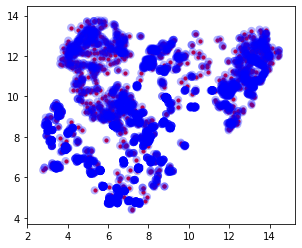

In [24]:
# Read the shapefile into a GeoDataFrame
gdf = gpd.read_file(health_facility)

# Create a GeoDataFrame with 20 km buffer around points
gdf_buffer = gdf.copy()
gdf_buffer['geometry'] = gdf_buffer['geometry'].buffer(0.2)  # 0.2 represents 20 km in degrees (for WGS 84)

# Plot the original points
ax = gdf.plot(marker='o', color='red', markersize=10)

# Plot the buffer around points
gdf_buffer.plot(ax=ax, alpha=0.3, color='blue')

# Show the plot
plt.show()

In [25]:
# Dissolve overlapping buffers
dissolved_buffers = gdf_buffer.unary_union

# Convert the result to a GeoDataFrame
dissolved_buffers_gdf = gpd.GeoDataFrame(geometry=[dissolved_buffers])

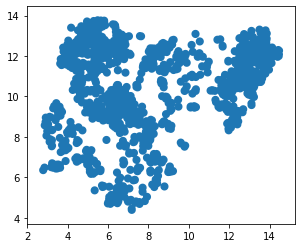

In [26]:
# Plot the dissolved buffers
dissolved_buffers_gdf.plot()

# Show the plot
plt.show()

In [27]:
# Perform zonal statistics 
stats = zonal_stats(dissolved_buffers_gdf, raster_path, stats="sum")

# Add the zonal statistics to the GeoDataFrame
dissolved_buffers_gdf['sum_value'] = [stat['sum'] if stat['sum'] is not None else nodata_value for stat in stats]

In [28]:
dissolved_buffers_gdf

,geometry,sum_value
0,"MULTIPOLYGON (((2.88940 6.17641, 2.87165 6.168...",62182168.0


In [29]:
# Path to the raster
raster_path = raster_sum

# Open the raster file
with rasterio.open(raster_path) as src:
    # Read Band 1 data
    band1_data = src.read(1)

    # Get NoData value from raster metadata
    nodata_value = src.nodata

    # Mask NoData values
    masked_band1 = np.ma.masked_values(band1_data, nodata_value)

    # Calculate the sum of Band 1, ignoring NoData values
    all_children = np.sum(masked_band1)

# Print the sum
print(f"All children (ignoring NoData): {all_children}")

All children (ignoring NoData): 90525776.0


In [30]:
children_inside_buffers = dissolved_buffers_gdf['sum_value'].sum()

# Subtract sum_value from band1_sum
children_outside_buffers = all_children - children_inside_buffers

# Print the result
print(f"Children outside of buffers: {children_outside_buffers}")

Children outside of buffers: 28343608.0


## Conclusion: In Nigeria, health facilities in 20km catchment area covered 62,182,168 children age 0-14 and 28,343,608 children outside of 20km area. 

### One of the solutions for reaching all population in Nigeria is presented in this video. 

In [31]:
%%html
<iframe width="900" height="500" src="https://www.youtube.com/embed/SXN76-EZnsM?si=FSS2izgMYC6rso6T" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>

#### This notebook was created by Zhanar Haimovich for training purposes only. 